# Scrap and Sentiment Analysis of STRAVA Reviews App

### Andika Insan Patria
### 5026221211



# Import Library

In [ ]:
!pip install google_play_scraper
!pip install textblob
!pip install seaborn

from google_play_scraper import app, Sort, reviews_all
import pandas as pd
import numpy as np
import sklearn
import requests
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import textblob
#from wordcloud import WordCloud
from pathlib import Path
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score

import pickle
import re
import time
import datetime                              # access to %%time, for timing individual notebook cells
import os
from PIL import Image
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

%matplotlib inline
%config InlineBackend.figure_format='retina'

plt.style.use('seaborn-v0_8')
plt.rcParams["figure.figsize"] = (15,10)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.9 MB/s eta 0:00:00


#Cleaning Data

In [ ]:
#Android App My Fitness Pal link from Google Play at
#com.strava
#The apps ID found in the link after id=com.strava&hl=en
#The apps name on Google Play titled: MyFitnessPal: Calorie Counter
#Dated 11 Maret 2025: number of reviews 2.81M++

from google_play_scraper import app, Sort, reviews_all

strava_reviews = reviews_all(
   'com.strava',
  sleep_milliseconds=0, # defaults to 0
   lang='en', # defaults to 'en'
   sort=Sort.NEWEST, # defaults to Sort.MOST_RELEVANT
)

In [ ]:
#Save the My Fitness Pal Apps reviews into dataframe
df_strava_reviews = pd.DataFrame(np.array(strava_reviews), columns=['content'])
df_strava_reviews = df_strava_reviews.join(pd.DataFrame(df_strava_reviews.pop('content').tolist()))
df_strava_reviews.to_csv(r'df_strava.csv', index=False)

In [ ]:
df_strava_reviews  # Menampilkan seluruh dataframe

,reviewId,userName,userImage,content,score,thumbsUpCount,reviewCreatedVersion,at,replyContent,repliedAt,appVersion
0,56f50a90-7086-4f78-a813-5bf64c8d7d5f,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,It would also be nice to filter out those stup...,1,4,402.15,2025-03-17 17:24:19,None,NaT,402.15
1,cc53532d-2f38-4a7f-bb9f-6548f4fc1d69,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20,None,NaT,402.15
2,62d04594-9ef9-44f8-a467-945178db901f,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,very good application,5,0,402.15,2025-03-17 03:04:11,None,NaT,402.15
3,df5d16f7-b088-4516-a2b2-02ca1a2787c7,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,If you can add interval timer and interval dis...,4,0,402.15,2025-03-17 02:25:15,None,NaT,402.15
4,c8ed90d6-08c2-4ccb-a249-8a418a150fa2,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Great. Keep me engaged.,4,0,401.10,2025-03-17 01:42:23,None,NaT,401.10
...,...,...,...,...,...,...,...,...,...,...,...
104382,a37ca3d8-832b-4074-a3c8-135c344c635e,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,"Decent, but no ability to enter in Biometrics,...",3,0,1.0.1,2011-06-14 22:39:27,None,NaT,1.0.1
104383,45700ea5-8cb0-4b1d-b8dd-cfae9452e920,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Very useful but report seems a inaccurate at t...,4,0,1.0,2011-06-14 20:18:16,None,NaT,1.0
104384,706b7884-a2bf-4298-b542-e0570fa7b878,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Nice app. Would give 5* if I could view map du...,4,1,1.0,2011-06-13 16:27:19,None,NaT,1.0
104385,eef39bbf-0709-455d-8221-9b505bf74bb7,A Google user,https://play-lh.googleusercontent.com/EGemoI2N...,Nice clean design. Simple to use with all the ...,5,3,1.0,2011-06-09 23:06:40,None,NaT,1.0


In [ ]:
# Informasi pada tabel
df_strava = df_strava_reviews.copy()

# Menambahkan kolom 'id' sebagai increment
df_strava['id'] = range(1, len(df_strava) + 1)

# Menampilkan informasi dataframe
df_strava.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104387 entries, 0 to 104386
Data columns (total 12 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   reviewId              104387 non-null  object        
 1   userName              104387 non-null  object        
 2   userImage             104387 non-null  object        
 3   content               104040 non-null  object        
 4   score                 104387 non-null  int64         
 5   thumbsUpCount         104387 non-null  int64         
 6   reviewCreatedVersion  96618 non-null   object        
 7   at                    104387 non-null  datetime64[ns]
 8   replyContent          144 non-null     object        
 9   repliedAt             144 non-null     datetime64[ns]
 10  appVersion            96618 non-null   object        
 11  id                    104387 non-null  int64         
dtypes: datetime64[ns](2), int64(3), object(7)
memory usage: 9.

In [ ]:
# Drop kolom yang tidak diperlukan, hanya menyisakan kolom yang dibutuhkan
df_strava = df_strava[['id', 'content', 'score', 'thumbsUpCount', 'reviewCreatedVersion', 'at']]

# Menampilkan dataframe hasil
df_strava

,id,content,score,thumbsUpCount,reviewCreatedVersion,at
0,1,It would also be nice to filter out those stup...,1,4,402.15,2025-03-17 17:24:19
1,2,Can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20
2,3,very good application,5,0,402.15,2025-03-17 03:04:11
3,4,If you can add interval timer and interval dis...,4,0,402.15,2025-03-17 02:25:15
4,5,Great. Keep me engaged.,4,0,401.10,2025-03-17 01:42:23
...,...,...,...,...,...,...
104382,104383,"Decent, but no ability to enter in Biometrics,...",3,0,1.0.1,2011-06-14 22:39:27
104383,104384,Very useful but report seems a inaccurate at t...,4,0,1.0,2011-06-14 20:18:16
104384,104385,Nice app. Would give 5* if I could view map du...,4,1,1.0,2011-06-13 16:27:19
104385,104386,Nice clean design. Simple to use with all the ...,5,3,1.0,2011-06-09 23:06:40


##Step 1 - Remove Zero Scores from User Ratings

In [ ]:
# Menghapus baris dengan nilai score = 0
df_strava = df_strava[df_strava['score'] != 0]

In [ ]:
#Check number of reviews scores
df_strava['score'].value_counts()

,count
score,
5,63915
1,14914
4,13317
3,6330
2,5911


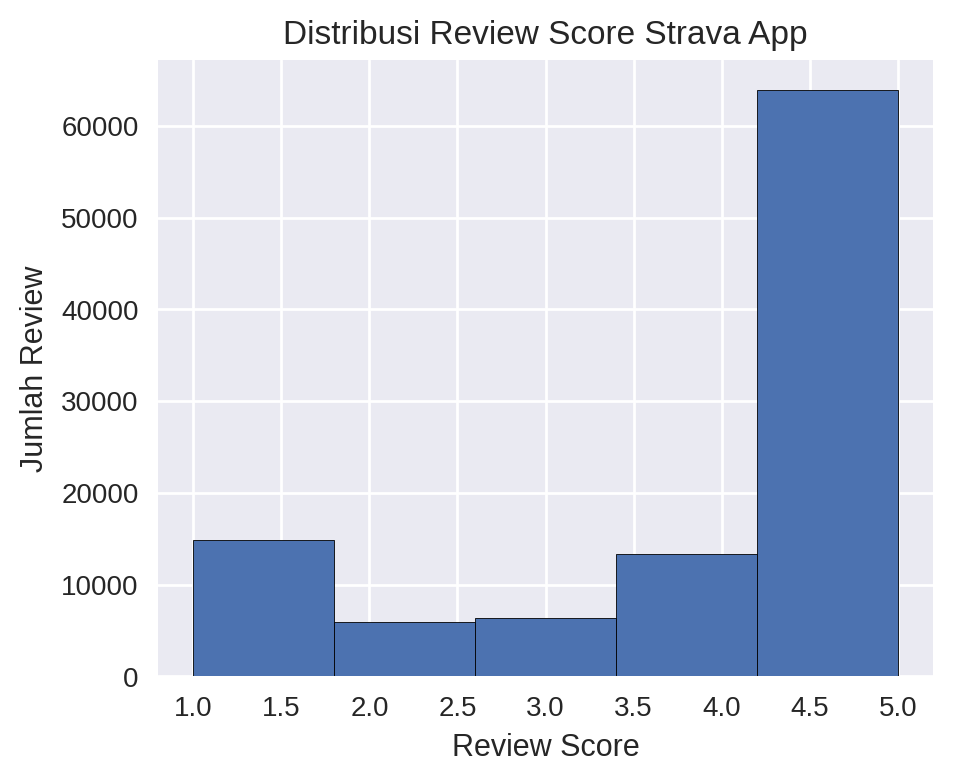

In [ ]:
# Menampilkan review score ke dalam bar chart
#plt.figure(figsize=[5,4])
#plt.hist(df_hdrev['score'])
#plt.show()

# Menampilkan distribusi review score dalam bentuk histogram
plt.figure(figsize=[5, 4])
plt.hist(df_strava['score'], bins=5, edgecolor='black')  # Menambahkan batas agar lebih jelas
plt.xlabel('Review Score')
plt.ylabel('Jumlah Review')
plt.title('Distribusi Review Score Strava App')
plt.show()

##Step 2 - Remove Empty Review

In [ ]:
# Menghapus review yang kosong atau NaN pada kolom 'content'
df_strava = df_strava.dropna(subset=['content'])  # Hapus NaN
df_strava = df_strava[df_strava['content'].str.strip() != '']  # Hapus string kosong setelah di-trim


In [ ]:
# Memeriksa apakah masih ada review kosong
df_strava[df_strava['content'].str.strip() == '']

,id,content,score,thumbsUpCount,reviewCreatedVersion,at


##Step 3 - Hapus review selain bahasa inggris

In [ ]:
print(df_strava_reviews['content'][0])

It would also be nice to filter out those stupid virtual Zwift/Rouvy and activities. And I find notifications annoying. Not sure why I need a notification for my own workout.


In [ ]:
!pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 7.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993222 sha256=b10f45f91ead3a4a6f6a83145e257bff908ae9eed553a87bfe60e4bf8e26754d
  Stored in directory: /root/.cache/pip/wheels/0a/f2/b2/e5ca405801e05eb7c8ed5b3b4bcf1fcabcd6272c167640072e
Successfully built langdetect


In [ ]:
from langdetect import detect, LangDetectException
import pandas as pd
from collections import Counter

def detect_language(text):
    try:
        return detect(str(text))  # Pastikan teks dalam bentuk string
    except LangDetectException:
        return 'unknown'  # Jika error, kembalikan 'unknown'

# Terapkan fungsi ke kolom 'content'
df_strava['language'] = df_strava['content'].fillna('').apply(detect_language)

In [ ]:
# Hitung jumlah review berdasarkan bahasa
language_counts = Counter(df_strava['language'])
language_df = pd.DataFrame.from_dict(language_counts, orient='index', columns=['count'])
language_df.index.name = 'language'
language_df = language_df.sort_values(by=['count'], ascending=False).reset_index()

# Filter hanya review yang berbahasa Inggris
df_strava = df_strava[df_strava['language'] == 'en']

# Hapus kolom 'language' setelah digunakan
df_strava.drop(columns=['language'], inplace=True)

# Tampilkan distribusi bahasa
language_df


<ipython-input-16-b16d70c3a7f7>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_strava.drop(columns=['language'], inplace=True)


,language,count
0,en,86441
1,af,2495
2,so,1855
3,ca,1344
4,it,1324
5,no,1204
6,fr,1201
7,ro,1194
8,sl,830
9,id,677


In [ ]:
df_strava.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86441 entries, 0 to 104386
Data columns (total 6 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   id                    86441 non-null  int64         
 1   content               86441 non-null  object        
 2   score                 86441 non-null  int64         
 3   thumbsUpCount         86441 non-null  int64         
 4   reviewCreatedVersion  80488 non-null  object        
 5   at                    86441 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(2)
memory usage: 4.6+ MB


In [ ]:
# print(df_strava['content'][500])  # Opsional, hanya jika ingin mengecek indeks tertentu

try:
    print(df_strava['content'][0])
except (KeyError, IndexError):
    print("content sudah dihapus")

It would also be nice to filter out those stupid virtual Zwift/Rouvy and activities. And I find notifications annoying. Not sure why I need a notification for my own workout.


#Data Preprocessing

In [ ]:
!pip install emoji
!pip install wordcloud

import numpy as np
import pandas as pd
pd.set_option("display.max_colwidth", 200)
#from pandas_profiling import ProfileReport
import regex
import nltk
import wordcloud
import textblob

from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
from textblob import TextBlob

import string
import re
import emoji

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 8.3 MB/s eta 0:00:00


## Step 3 - Sentiment Polarity and Subjective Before Preprocessing

In [ ]:
#Creating polarity on the column: content (review from the apps) using TextBlob
#Read https://textblob.readthedocs.io/en/dev/quickstart.html

# Handle None values in 'content' column by replacing them with empty strings
df_strava['sentiment_polarity'] = df_strava['content'].astype(str).apply(lambda x: TextBlob(x).polarity)
df_strava['sentiment_subjective'] = df_strava['content'].astype(str).apply(lambda x: TextBlob(x).subjectivity)

In [ ]:
#df_hdrev.loc[:,["content","score","sentiment_polarity", "sentiment_subjective","at"]]
df_strava.loc[:, ["id", "content", "score", "sentiment_polarity", "sentiment_subjective"]]

,id,content,score,sentiment_polarity,sentiment_subjective
0,1,It would also be nice to filter out those stupid virtual Zwift/Rouvy and activities. And I find notifications annoying. Not sure why I need a notification for my own workout.,1,-0.130000,0.957778
1,2,Can't connect samsung app and device,2,0.000000,0.000000
2,3,very good application,5,0.910000,0.780000
3,4,If you can add interval timer and interval distance function. 5 stars is a guarantee.,4,0.000000,0.000000
5,6,very good apps👍,5,0.910000,0.780000
...,...,...,...,...,...
104382,104383,"Decent, but no ability to enter in Biometrics, etc. Hopefully this will mature.",3,0.133333,0.383333
104383,104384,Very useful but report seems a inaccurate at times. Said I did 58 miles per hour on a flat path???,4,0.182500,0.062500
104384,104385,Nice app. Would give 5* if I could view map during ride,4,0.600000,1.000000
104385,104386,Nice clean design. Simple to use with all the sophisticated date. Love it.,5,0.393333,0.731429


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_strava.loc[:, 'sentiment_rating'] = df_strava['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

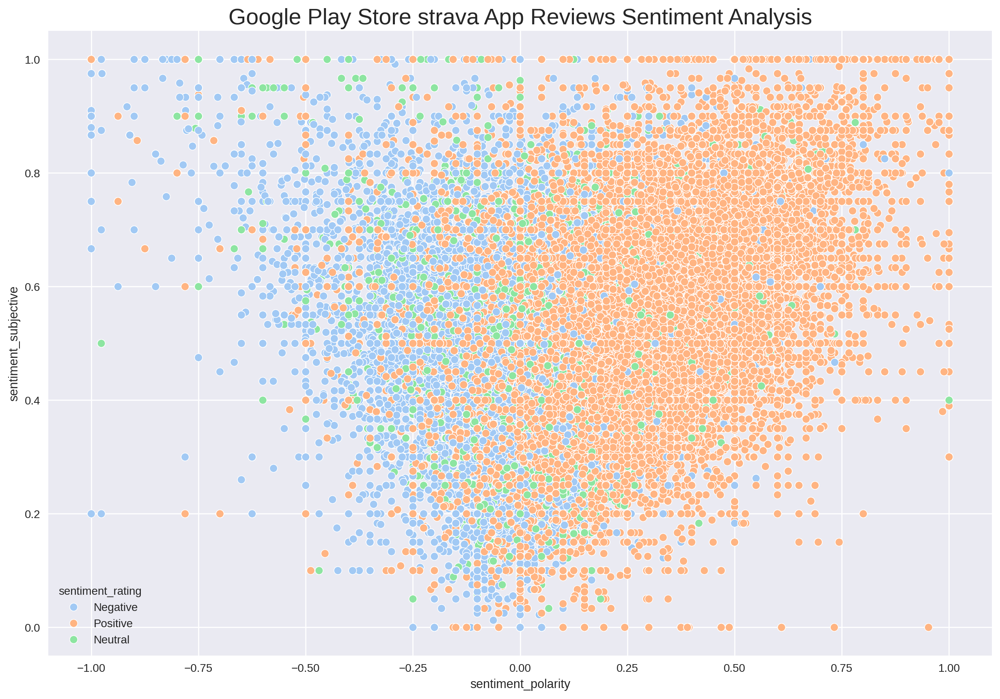

In [ ]:
plt.figure(figsize=(15, 10))

# Scatter plot analisis sentimen strava reviews
sns.scatterplot(x=df_strava['sentiment_polarity'],
                y=df_strava['sentiment_subjective'],
                hue=df_strava['sentiment_rating'],
                edgecolor='white',
                palette="pastel")

plt.title("Google Play Store strava App Reviews Sentiment Analysis", fontsize=20)
plt.show()


## Step 4 - Remove Special Characters (Emoji)

In [ ]:
# print(df_hdrev_raw['content'][1])
# print(df_hdrev_raw['content'][28])
# print(df_hdrev_raw['content'][234])

In [ ]:
import re

# Fungsi untuk menghapus emoji dari teks
def remove_emojis(text):
    emoji_pattern = re.compile(
        "["
        u"\U0001F600-\U0001F64F"  # Emoticons
        u"\U0001F300-\U0001F5FF"  # Simbol & Piktograf
        u"\U0001F680-\U0001F6FF"  # Simbol Transportasi & Peta
        u"\U0001F1E0-\U0001F1FF"  # Bendera (iOS)
        u"\U00002500-\U00002BEF"  # Karakter Cina
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"  # Simbol Unicode tambahan
        u"\u2640-\u2642"  # Simbol Gender
        u"\u2600-\u2B55"  # Simbol Lainnya
        u"\u200d"  # Zero Width Joiner
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # Dingbats
        u"\u3030"
        "]+", flags=re.UNICODE
    )
    return emoji_pattern.sub(r'', text) if isinstance(text, str) else text  # Hanya proses jika teks

# Terapkan fungsi remove_emojis ke kolom 'content'
df_strava.loc[:, 'content'] = df_strava['content'].astype(str).apply(remove_emojis)

In [ ]:
print(df_strava['content'][1])
print(df_strava['content'][28])
print(df_strava['content'][234])


Can't connect samsung app and device
i have over 300 saved routes but can only access like 20 of them,it won't load the rest
this is a good apps


## Step 5 - Lower Case the Content

In [ ]:
print(df_strava_reviews['content'][5])
print(df_strava_reviews['content'][50])

very good apps👍
it's really good to stay fit and track you running. I'll prefer strava than the other running apps


In [ ]:
# Mengubah tipe data kolom content menjadi string
df_strava.loc[:, 'content'] = df_strava['content'].astype(str)

In [ ]:
# # Mengubah semua teks di kolom 'content' menjadi huruf kecil
df_strava.loc[:, 'content'] = df_strava['content'].apply(lambda x: x.lower())
# print(df_hdrev['content'][5])
# print(df_hdrev['content'][55])

## Step 1 - Tokenizing

In [ ]:
import nltk
import os
import shutil

# Hapus cache NLTK
nltk_data_path = os.path.expanduser('~/nltk_data')
if os.path.exists(nltk_data_path):
    shutil.rmtree(nltk_data_path)  # Hapus semua data NLTK

# Download ulang 'punkt'
nltk.download('punkt')

# Paksa NLTK mencari ulang lokasi tokenizers
nltk.data.find('tokenizers/punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


FileSystemPathPointer('/root/nltk_data/tokenizers/punkt')

In [ ]:
import nltk
# Download the missing 'punkt_tab' data package
nltk.download('punkt_tab')

from nltk.tokenize import word_tokenize

# Pastikan df_strava adalah salinan independen
df_strava = df_strava.copy()

# Tokenisasi kolom 'content'
df_strava['token'] = df_strava['content'].apply(lambda x: word_tokenize(str(x)))

# Tampilkan dataframe dengan token
display(df_strava[['content', 'token']])

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


,content,token
0,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwift/rouvy, and, activities, ., and, i, find, notifications, annoying, ., not, sure, why, i, need, a, notification, for, my, o..."
1,can't connect samsung app and device,"[ca, n't, connect, samsung, app, and, device]"
2,very good application,"[very, good, application]"
3,if you can add interval timer and interval distance function. 5 stars is a guarantee.,"[if, you, can, add, interval, timer, and, interval, distance, function, ., 5, stars, is, a, guarantee, .]"
5,very good apps,"[very, good, apps]"
...,...,...
104382,"decent, but no ability to enter in biometrics, etc. hopefully this will mature.","[decent, ,, but, no, ability, to, enter, in, biometrics, ,, etc, ., hopefully, this, will, mature, .]"
104383,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,"[very, useful, but, report, seems, a, inaccurate, at, times, ., said, i, did, 58, miles, per, hour, on, a, flat, path, ?, ?, ?]"
104384,nice app. would give 5* if i could view map during ride,"[nice, app, ., would, give, 5, *, if, i, could, view, map, during, ride]"
104385,nice clean design. simple to use with all the sophisticated date. love it.,"[nice, clean, design, ., simple, to, use, with, all, the, sophisticated, date, ., love, it, .]"


##Expand Contractions

In [ ]:
!pip install spacy
!pip install contractions
import spacy
import contractions

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.3/118.3 kB 9.3 MB/s eta 0:00:00


In [ ]:
import nltk
from nltk.tokenize import word_tokenize
import contractions

def expand_contractions(text):
    # Pastikan teks bukan None atau NaN sebelum diproses
    if isinstance(text, str) and len(text) > 0:
        try:
            return contractions.fix(text)  # Ekspansi kontraksi
        except IndexError:
            return text  # Jika terjadi error, kembalikan teks asli
    return text

# Terapkan ekspansi kontraksi ke kolom 'content'
df_strava['expanded_content'] = df_strava['content'].apply(expand_contractions)

# Tokenisasi setelah kontraksi diperluas
df_strava['token'] = df_strava['expanded_content'].apply(word_tokenize)

# Tampilkan hasil
display(df_strava[['content', 'expanded_content', 'token']])

,content,expanded_content,token
0,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwift/rouvy, and, activities, ., and, i, find, notifications, annoying, ., not, sure, why, i, need, a, notification, for, my, o..."
1,can't connect samsung app and device,cannot connect samsung app and device,"[can, not, connect, samsung, app, and, device]"
2,very good application,very good application,"[very, good, application]"
3,if you can add interval timer and interval distance function. 5 stars is a guarantee.,if you can add interval timer and interval distance function. 5 stars is a guarantee.,"[if, you, can, add, interval, timer, and, interval, distance, function, ., 5, stars, is, a, guarantee, .]"
5,very good apps,very good apps,"[very, good, apps]"
...,...,...,...
104382,"decent, but no ability to enter in biometrics, etc. hopefully this will mature.","decent, but no ability to enter in biometrics, etc. hopefully this will mature.","[decent, ,, but, no, ability, to, enter, in, biometrics, ,, etc, ., hopefully, this, will, mature, .]"
104383,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,"[very, useful, but, report, seems, a, inaccurate, at, times, ., said, i, did, 58, miles, per, hour, on, a, flat, path, ?, ?, ?]"
104384,nice app. would give 5* if i could view map during ride,nice app. would give 5* if i could view map during ride,"[nice, app, ., would, give, 5, *, if, i, could, view, map, during, ride]"
104385,nice clean design. simple to use with all the sophisticated date. love it.,nice clean design. simple to use with all the sophisticated date. love it.,"[nice, clean, design, ., simple, to, use, with, all, the, sophisticated, date, ., love, it, .]"


##Punctuations Removal

In [ ]:
import re
import string
def cleaning_text(text):
    # Menambah spasi setelah koma jika tidak ada spasi
    text = re.sub(r",(?!\s)", ", ", text)
    # Menghapus tab, newline, backslash
    text = text.replace('\\t', " ").replace('\\n', " ").replace('\\u', " ").replace('\\', "")
    # Menghapus karakter non-ASCII (emoticon, huruf Cina, dll.)
    text = text.encode('ascii', 'replace').decode('ascii')
    # Menghapus URL
    text = re.sub(r"(?i)(?:https?:\/\/)?(?:www\.)?(?:[a-zA-Z0-9-.]+)(?:\.[a-zA-Z]{2,6})(?:\/[^\s\r\n]*)?", "", text)
    # Menghapus angka
    text = re.sub(r"\d+", "", text)
    # Menghapus tanda baca
    text = text.translate(str.maketrans("", "", string.punctuation))
    # Menghapus whitespace berlebih dan karakter tunggal
    text = text.strip()
    text = re.sub('\s+', ' ', text)
    return re.sub(r"\b[a-zA-Z]\b", "", text)

# Terapkan fungsi pembersihan ke kolom content
df_strava['cleaned_content'] = df_strava['content'].astype(str).apply(cleaning_text)

# Tokenisasi setelah teks dibersihkan
df_strava['token'] = df_strava['cleaned_content'].apply(word_tokenize)

In [ ]:
df_strava.loc[:, ["content", "cleaned_content", "token"]]

,content,cleaned_content,token
0,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,it would also be nice to filter out those stupid virtual zwiftrouvy and activities and find notifications annoying not sure why need notification for my own workout,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]"
1,can't connect samsung app and device,cant connect samsung app and device,"[cant, connect, samsung, app, and, device]"
2,very good application,very good application,"[very, good, application]"
3,if you can add interval timer and interval distance function. 5 stars is a guarantee.,if you can add interval timer and interval distance function stars is guarantee,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]"
5,very good apps,very good apps,"[very, good, apps]"
...,...,...,...
104382,"decent, but no ability to enter in biometrics, etc. hopefully this will mature.",decent but no ability to enter in biometrics etc hopefully this will mature,"[decent, but, no, ability, to, enter, in, biometrics, etc, hopefully, this, will, mature]"
104383,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,very useful but report seems inaccurate at times said did miles per hour on flat path,"[very, useful, but, report, seems, inaccurate, at, times, said, did, miles, per, hour, on, flat, path]"
104384,nice app. would give 5* if i could view map during ride,nice app would give if could view map during ride,"[nice, app, would, give, if, could, view, map, during, ride]"
104385,nice clean design. simple to use with all the sophisticated date. love it.,nice clean design simple to use with all the sophisticated date love it,"[nice, clean, design, simple, to, use, with, all, the, sophisticated, date, love, it]"


##Before Stopwords removal

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
def freq_words(x, terms=30):
    all_words = ' '.join(text for text in x)
    all_words = all_words.split()

    word_counts = Counter(all_words)  # Hitung frekuensi kata
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Pilih kata dengan frekuensi tertinggi
    d = words_df.nlargest(columns="count", n=terms)

    plt.figure(figsize=(20, 5))
    ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))
    ax.set(ylabel='Count')
    plt.xticks(rotation=45)  # Memiringkan label agar lebih mudah dibaca
    plt.show()

<ipython-input-37-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


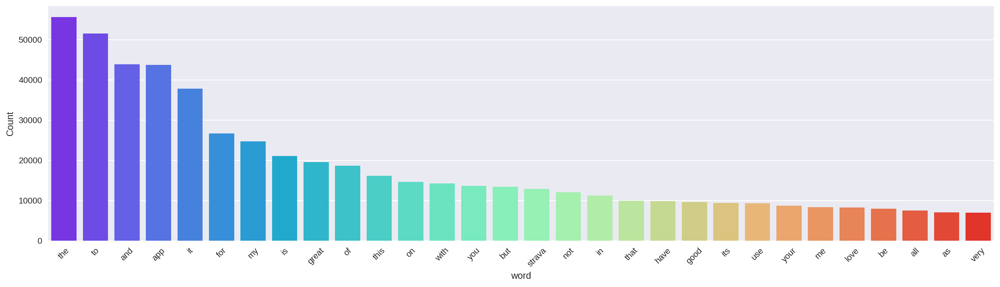

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_strava['cleaned_content'])

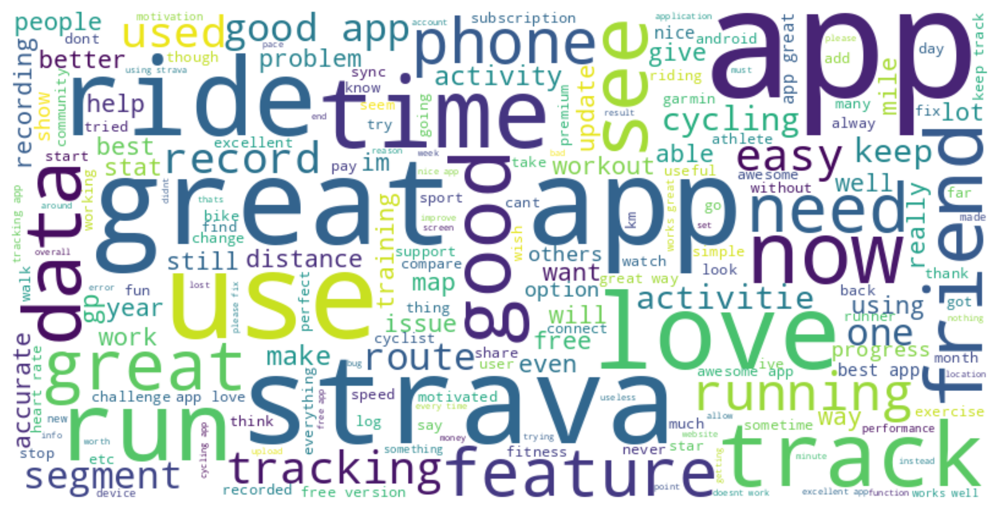

In [ ]:
# Gabungkan semua teks dalam kolom 'cleaned_content' menjadi satu string
all_words_after = ' '.join(df_strava['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Tampilkan WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()


##Stopword Removal

In [ ]:
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Ambil daftar stopwords bahasa Inggris
english_stopwords = set(stopwords.words('english'))  # Gunakan set untuk akses lebih cepat

# Tambahkan kata tambahan ke dalam stopwords
english_stopwords.update(['app', 'used'])  # update() lebih efisien dibanding extend()

# Terapkan stopword removal ke setiap list token
df_strava["token_after_sr"] = df_strava["token"].apply(lambda tokens: [word for word in tokens if isinstance(tokens, list) and word not in english_stopwords and word.isalpha()])

# Gabungkan token menjadi teks yang bersih dalam kolom cleaned_content
df_strava["cleaned_content"] = df_strava["token_after_sr"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan hasil
display(df_strava[['content', 'cleaned_content', 'token', 'token_after_sr']])

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


,content,cleaned_content,token,token_after_sr
0,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,would also nice filter stupid virtual zwiftrouvy activities find notifications annoying sure need notification workout,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvy, activities, find, notifications, annoying, sure, need, notification, workout]"
1,can't connect samsung app and device,cant connect samsung device,"[cant, connect, samsung, app, and, device]","[cant, connect, samsung, device]"
2,very good application,good application,"[very, good, application]","[good, application]"
3,if you can add interval timer and interval distance function. 5 stars is a guarantee.,add interval timer interval distance function stars guarantee,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]","[add, interval, timer, interval, distance, function, stars, guarantee]"
5,very good apps,good apps,"[very, good, apps]","[good, apps]"
...,...,...,...,...
104382,"decent, but no ability to enter in biometrics, etc. hopefully this will mature.",decent ability enter biometrics etc hopefully mature,"[decent, but, no, ability, to, enter, in, biometrics, etc, hopefully, this, will, mature]","[decent, ability, enter, biometrics, etc, hopefully, mature]"
104383,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,useful report seems inaccurate times said miles per hour flat path,"[very, useful, but, report, seems, inaccurate, at, times, said, did, miles, per, hour, on, flat, path]","[useful, report, seems, inaccurate, times, said, miles, per, hour, flat, path]"
104384,nice app. would give 5* if i could view map during ride,nice would give could view map ride,"[nice, app, would, give, if, could, view, map, during, ride]","[nice, would, give, could, view, map, ride]"
104385,nice clean design. simple to use with all the sophisticated date. love it.,nice clean design simple use sophisticated date love,"[nice, clean, design, simple, to, use, with, all, the, sophisticated, date, love, it]","[nice, clean, design, simple, use, sophisticated, date, love]"


In [ ]:
df_strava.head()

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr
0,1,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,1,4,402.15,2025-03-17 17:24:19,-0.13,0.957778,Negative,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]",it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,would also nice filter stupid virtual zwiftrouvy activities find notifications annoying sure need notification workout,"[would, also, nice, filter, stupid, virtual, zwiftrouvy, activities, find, notifications, annoying, sure, need, notification, workout]"
1,2,can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20,0.00,0.000000,Negative,"[cant, connect, samsung, app, and, device]",cannot connect samsung app and device,cant connect samsung device,"[cant, connect, samsung, device]"
2,3,very good application,5,0,402.15,2025-03-17 03:04:11,0.91,0.780000,Positive,"[very, good, application]",very good application,good application,"[good, application]"
3,4,if you can add interval timer and interval distance function. 5 stars is a guarantee.,4,0,402.15,2025-03-17 02:25:15,0.00,0.000000,Positive,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]",if you can add interval timer and interval distance function. 5 stars is a guarantee.,add interval timer interval distance function stars guarantee,"[add, interval, timer, interval, distance, function, stars, guarantee]"
5,6,very good apps,5,0,402.15,2025-03-17 01:04:59,0.91,0.780000,Positive,"[very, good, apps]",very good apps,good apps,"[good, apps]"


<ipython-input-37-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


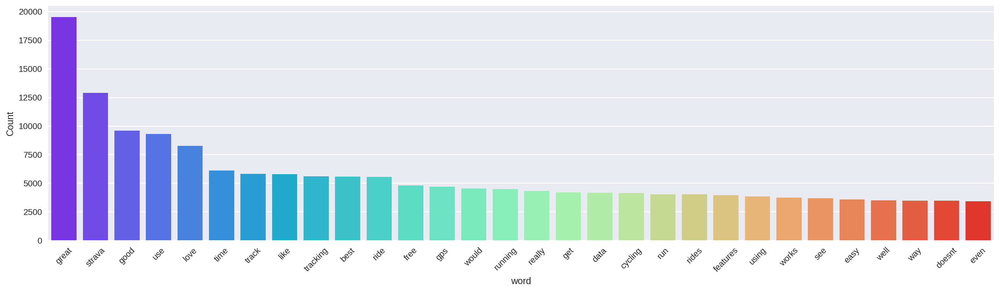

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_strava['cleaned_content'])

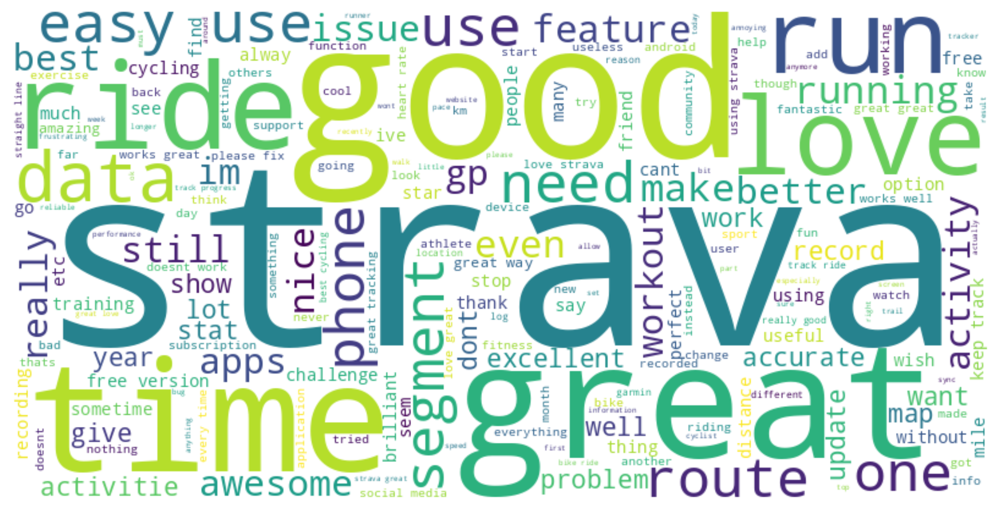

In [ ]:
# Gabungkan semua teks dalam kolom 'cleaned_content' menjadi satu string
all_words_after = ' '.join(df_strava['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Tampilkan WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.show()


##Stemming & Lemmatization

In [ ]:
import nltk

# Download the necessary NLTK data packages
nltk.download('wordnet')
nltk.download('universal_tagset')
nltk.download('averaged_perceptron_tagger_eng')

from nltk.stem import WordNetLemmatizer, PorterStemmer  # Import PorterStemmer
from nltk.corpus import wordnet
from nltk import pos_tag

lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()  # Initialize PorterStemmer

# Function to get the Part of Speech (POS) for more accurate lemmatization
def get_wordnet_pos(word):
    tag = pos_tag([word])[0][1][0].upper()  # Get the first letter of the POS tag
    tag_dict = {"J": wordnet.ADJ, "N": wordnet.NOUN, "V": wordnet.VERB, "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)  # Default to NOUN if not found

# Function for lemmatization with POS tagging
def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(word, get_wordnet_pos(word)) for word in tokens]

# Function for stemming
def stem_tokens(tokens):
    return [stemmer.stem(word) for word in tokens]

# Apply stemming to token_after_sr
df_strava["token_after_stem"] = df_strava["token_after_sr"].apply(stem_tokens)  # Apply stemming first

# Apply lemmatization to token_after_stem (lemmatize stemmed tokens)
df_strava["token_after_lemma"] = df_strava["token_after_stem"].apply(lemmatize_tokens)

# Gabungkan kembali token menjadi teks bersih setelah lemmatization
df_strava["cleaned_content"] = df_strava["token_after_lemma"].apply(lambda tokens: ' '.join(tokens))

# Tampilkan DataFrame dengan semua kolom, tetapi tanpa stemming
# df_strava = df_strava.drop(columns=["token_after_stem"])  # Keep or remove this line as needed
# Hapus kolom stemming jika tidak diperlukan lagi
# df_strava = df_strava.drop(columns=["token_after_stem"])  # You can uncomment this line if you want to remove 'token_after_stem' column after lemmatization

# Tampilkan dataframe dengan format awal yang sama
display(df_strava)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger_eng to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger_eng is already up-to-
[nltk_data]       date!


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_stem
0,1,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,1,4,402.15,2025-03-17 17:24:19,-0.130000,0.957778,Negative,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]",it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,would also nice filter stupid virtual zwiftrouvi activ find notif annoy sure need notif workout,"[would, also, nice, filter, stupid, virtual, zwiftrouvy, activities, find, notifications, annoying, sure, need, notification, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]"
1,2,can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20,0.000000,0.000000,Negative,"[cant, connect, samsung, app, and, device]",cannot connect samsung app and device,cant connect samsung devic,"[cant, connect, samsung, device]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]"
2,3,very good application,5,0,402.15,2025-03-17 03:04:11,0.910000,0.780000,Positive,"[very, good, application]",very good application,good applic,"[good, application]","[good, applic]","[good, applic]"
3,4,if you can add interval timer and interval distance function. 5 stars is a guarantee.,4,0,402.15,2025-03-17 02:25:15,0.000000,0.000000,Positive,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]",if you can add interval timer and interval distance function. 5 stars is a guarantee.,add interv timer interv distanc function star guarante,"[add, interval, timer, interval, distance, function, stars, guarantee]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]"
5,6,very good apps,5,0,402.15,2025-03-17 01:04:59,0.910000,0.780000,Positive,"[very, good, apps]",very good apps,good app,"[good, apps]","[good, app]","[good, app]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104382,104383,"decent, but no ability to enter in biometrics, etc. hopefully this will mature.",3,0,1.0.1,2011-06-14 22:39:27,0.133333,0.383333,Neutral,"[decent, but, no, ability, to, enter, in, biometrics, etc, hopefully, this, will, mature]","decent, but no ability to enter in biometrics, etc. hopefully this will mature.",decent abil enter biometr etc hope matur,"[decent, ability, enter, biometrics, etc, hopefully, mature]","[decent, abil, enter, biometr, etc, hope, matur]","[decent, abil, enter, biometr, etc, hope, matur]"
104383,104384,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,4,0,1.0,2011-06-14 20:18:16,0.182500,0.062500,Positive,"[very, useful, but, report, seems, inaccurate, at, times, said, did, miles, per, hour, on, flat, path]",very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,use report seem inaccur time say mile per hour flat path,"[useful, report, seems, inaccurate, times, said, miles, per, hour, flat, path]","[use, report, seem, inaccur, time, say, mile, per, hour, flat, path]","[use, report, seem, inaccur, time, said, mile, per, hour, flat, path]"
104384,104385,nice app. would give 5* if i could view map during ride,4,1,1.0,2011-06-13 16:27:19,0.600000,1.000000,Positive,"[nice, app, would, give, if, could, view, map, during, ride]",nice app. would give 5*

##Rare Words Removal

In [ ]:
from nltk.probability import FreqDist

# Hitung frekuensi kata berdasarkan seluruh dataset
all_tokens = [word for tokens in df_strava["token_after_lemma"] for word in tokens]  # Gabungkan semua token
fdist = FreqDist(all_tokens)  # Hitung frekuensi global

# Tentukan kata yang jarang muncul berdasarkan threshold
threshold = 2
rare_words = set(word for word, freq in fdist.items() if freq <= threshold)

# Fungsi untuk menghapus kata langka berdasarkan frekuensi global
def rare_words_removal(tokens):
    return [word for word in tokens if word not in rare_words]

# Terapkan fungsi ini ke setiap baris di kolom 'token_after_lemma'
df_strava['token_after_rwr'] = df_strava['token_after_lemma'].apply(rare_words_removal)

# Tampilkan DataFrame untuk verifikasi
display(df_strava)

,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_stem,token_after_rwr
0,1,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,1,4,402.15,2025-03-17 17:24:19,-0.130000,0.957778,Negative,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]",it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,would also nice filter stupid virtual zwiftrouvi activ find notif annoy sure need notif workout,"[would, also, nice, filter, stupid, virtual, zwiftrouvy, activities, find, notifications, annoying, sure, need, notification, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, activ, find, notif, annoy, sure, need, notif, workout]"
1,2,can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20,0.000000,0.000000,Negative,"[cant, connect, samsung, app, and, device]",cannot connect samsung app and device,cant connect samsung devic,"[cant, connect, samsung, device]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]"
2,3,very good application,5,0,402.15,2025-03-17 03:04:11,0.910000,0.780000,Positive,"[very, good, application]",very good application,good applic,"[good, application]","[good, applic]","[good, applic]","[good, applic]"
3,4,if you can add interval timer and interval distance function. 5 stars is a guarantee.,4,0,402.15,2025-03-17 02:25:15,0.000000,0.000000,Positive,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]",if you can add interval timer and interval distance function. 5 stars is a guarantee.,add interv timer interv distanc function star guarante,"[add, interval, timer, interval, distance, function, stars, guarantee]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]"
5,6,very good apps,5,0,402.15,2025-03-17 01:04:59,0.910000,0.780000,Positive,"[very, good, apps]",very good apps,good app,"[good, apps]","[good, app]","[good, app]","[good, app]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
104382,104383,"decent, but no ability to enter in biometrics, etc. hopefully this will mature.",3,0,1.0.1,2011-06-14 22:39:27,0.133333,0.383333,Neutral,"[decent, but, no, ability, to, enter, in, biometrics, etc, hopefully, this, will, mature]","decent, but no ability to enter in biometrics, etc. hopefully this will mature.",decent abil enter biometr etc hope matur,"[decent, ability, enter, biometrics, etc, hopefully, mature]","[decent, abil, enter, biometr, etc, hope, matur]","[decent, abil, enter, biometr, etc, hope, matur]","[decent, abil, enter, biometr, etc, hope, matur]"
104383,104384,very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,4,0,1.0,2011-06-14 20:18:16,0.182500,0.062500,Positive,"[very, useful, but, report, seems, inaccurate, at, times, said, did, miles, per, hour, on, flat, path]",very useful but report seems a inaccurate at times. said i did 58 miles per hour on a flat path???,use report seem inaccur time say mile per hour flat path,"[useful, report, seems, inaccurate, times, said, miles, per, hour, flat, path]","[use, report, seem, inaccur, time, say, mile, per

##Common Words Removal

In [ ]:
from nltk.probability import FreqDist

# Hitung threshold secara fleksibel
threshold = max(10, int(len(df_strava) * 0.05))

# Hitung frekuensi kata SEKALI SAJA untuk semua data
all_tokens = [word for sublist in df_strava["token_after_rwr"] for word in sublist]
fdist = FreqDist(all_tokens)

# Tentukan kata-kata umum yang akan dihapus
common_words = set(word for word, freq in fdist.items() if freq >= threshold)

def common_words_removal(tokens):
    filtered_tokens = [word for word in tokens if word not in common_words]
    return filtered_tokens if filtered_tokens else ["EMPTY"]  # Hindari baris kosong

# Terapkan common words removal ke seluruh kolom (lebih cepat)
df_strava['token_after_cwr'] = df_strava['token_after_rwr'].apply(common_words_removal)

# Print kata-kata umum yang dihapus (untuk verifikasi)
print("Common words removed:", list(common_words)[:20])  # Tampilkan 20 kata pertama

# Tampilkan 5 baris pertama DataFrame
df_strava.head()

Common words removed: ['good', 'activ', 'get', 'like', 'track', 'great', 'best', 'strava', 'record', 'work', 'run', 'well', 'love', 'free', 'gp', 'see', 'time', 'cycl', 'would', 'use']


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_stem,token_after_rwr,token_after_cwr
0,1,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,1,4,402.15,2025-03-17 17:24:19,-0.13,0.957778,Negative,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]",it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,would also nice filter stupid virtual zwiftrouvi activ find notif annoy sure need notif workout,"[would, also, nice, filter, stupid, virtual, zwiftrouvy, activities, find, notifications, annoying, sure, need, notification, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, activ, find, notif, annoy, sure, need, notif, workout]","[also, nice, filter, stupid, virtual, find, notif, annoy, sure, need, notif, workout]"
1,2,can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20,0.00,0.000000,Negative,"[cant, connect, samsung, app, and, device]",cannot connect samsung app and device,cant connect samsung devic,"[cant, connect, samsung, device]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]"
2,3,very good application,5,0,402.15,2025-03-17 03:04:11,0.91,0.780000,Positive,"[very, good, application]",very good application,good applic,"[good, application]","[good, applic]","[good, applic]","[good, applic]",[applic]
3,4,if you can add interval timer and interval distance function. 5 stars is a guarantee.,4,0,402.15,2025-03-17 02:25:15,0.00,0.000000,Positive,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]",if you can add interval timer and interval distance function. 5 stars is a guarantee.,add interv timer interv distanc function star guarante,"[add, interval, timer, interval, distance, function, stars, guarantee]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]"
5,6,very good apps,5,0,402.15,2025-03-17 01:04:59,0.91,0.780000,Positive,"[very, good, apps]",very good apps,good app,"[good, apps]","[good, app]","[good, app]","[good, app]",[app]


## Step 4 - Apply Sentiment Rating

In [ ]:
# Pastikan cleaned_content tidak ada nilai NaN
df_strava['cleaned_content'] = df_strava['cleaned_content'].fillna('')

# Hitung sentiment polarity dan subjectivity
df_strava['sentiment_polarity'] = df_strava['cleaned_content'].apply(lambda x: TextBlob(x).polarity)
df_strava['sentiment_subjective'] = df_strava['cleaned_content'].apply(lambda x: TextBlob(x).subjectivity)

# Tampilkan hasil
df_strava.head()


,id,content,score,thumbsUpCount,reviewCreatedVersion,at,sentiment_polarity,sentiment_subjective,sentiment_rating,token,expanded_content,cleaned_content,token_after_sr,token_after_lemma,token_after_stem,token_after_rwr,token_after_cwr
0,1,it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,1,4,402.15,2025-03-17 17:24:19,0.1,0.962963,Negative,"[it, would, also, be, nice, to, filter, out, those, stupid, virtual, zwiftrouvy, and, activities, and, find, notifications, annoying, not, sure, why, need, notification, for, my, own, workout]",it would also be nice to filter out those stupid virtual zwift/rouvy and activities. and i find notifications annoying. not sure why i need a notification for my own workout.,would also nice filter stupid virtual zwiftrouvi activ find notif annoy sure need notif workout,"[would, also, nice, filter, stupid, virtual, zwiftrouvy, activities, find, notifications, annoying, sure, need, notification, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, zwiftrouvi, activ, find, notif, annoy, sure, need, notif, workout]","[would, also, nice, filter, stupid, virtual, activ, find, notif, annoy, sure, need, notif, workout]","[also, nice, filter, stupid, virtual, find, notif, annoy, sure, need, notif, workout]"
1,2,can't connect samsung app and device,2,0,402.15,2025-03-17 05:59:20,0.0,0.000000,Negative,"[cant, connect, samsung, app, and, device]",cannot connect samsung app and device,cant connect samsung devic,"[cant, connect, samsung, device]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]","[cant, connect, samsung, devic]"
2,3,very good application,5,0,402.15,2025-03-17 03:04:11,0.7,0.600000,Positive,"[very, good, application]",very good application,good applic,"[good, application]","[good, applic]","[good, applic]","[good, applic]",[applic]
3,4,if you can add interval timer and interval distance function. 5 stars is a guarantee.,4,0,402.15,2025-03-17 02:25:15,0.0,0.000000,Positive,"[if, you, can, add, interval, timer, and, interval, distance, function, stars, is, guarantee]",if you can add interval timer and interval distance function. 5 stars is a guarantee.,add interv timer interv distanc function star guarante,"[add, interval, timer, interval, distance, function, stars, guarantee]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]","[add, interv, timer, interv, distanc, function, star, guarante]"
5,6,very good apps,5,0,402.15,2025-03-17 01:04:59,0.7,0.600000,Positive,"[very, good, apps]",very good apps,good app,"[good, apps]","[good, app]","[good, app]","[good, app]",[app]


In [ ]:
#Add a column name polarity_rating from changing the score of the review into 3 labels: Pos, Negative Neutral
df_strava['sentiment_rating'] = df_strava['score'].apply(lambda x: 'Positive' if x > 3 else ('Neutral' if x == 3 else 'Negative'))

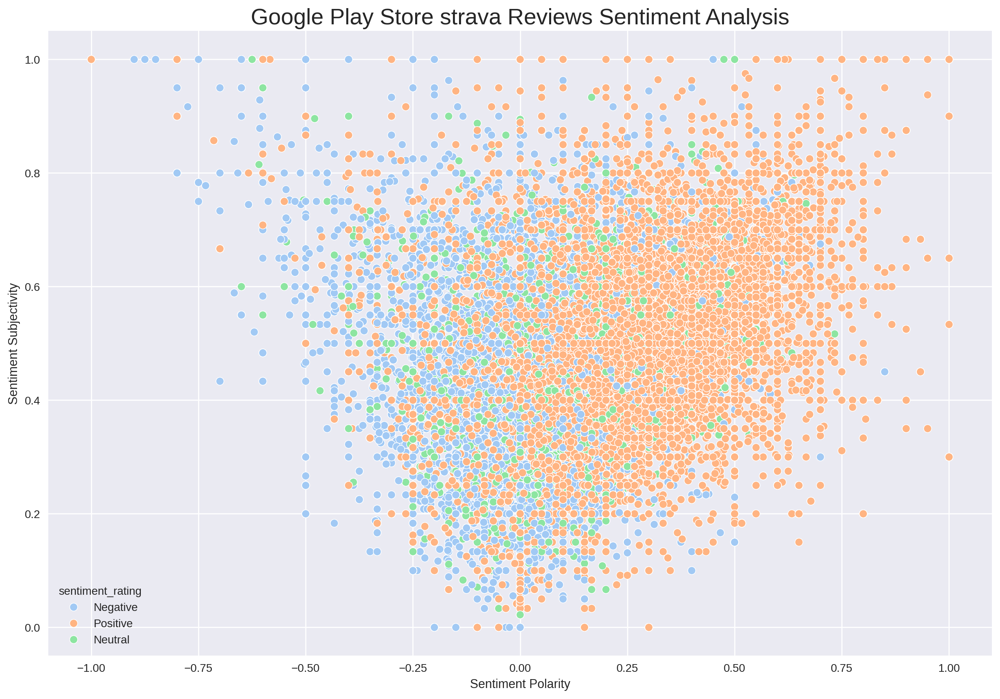

In [ ]:
# Scatter plot untuk sentiment polarity vs sentiment subjectivity
sns.scatterplot(
    x=df_strava['sentiment_polarity'],
    y=df_strava['sentiment_subjective'],
    hue=df_strava['sentiment_rating'],  # Warna berdasarkan sentimen (Positive, Neutral, Negative)
    edgecolor='white',
    palette="pastel"
)

plt.title("Google Play Store strava Reviews Sentiment Analysis", fontsize=20)
plt.xlabel("Sentiment Polarity")
plt.ylabel("Sentiment Subjectivity")
plt.show()


Dari scatter plot analisis sentimen dari ulasan Halodoc di Google Play Stor didapatkan penjelasan :

- **Sumbu X (sentiment_polarity)**: Menunjukkan polaritas sentimen dari ulasan, dengan nilai berkisar dari -1 (sangat negatif) hingga 1 (sangat positif). Nilai mendekati 0 menunjukkan sentimen netral.

- **Sumbu Y (sentiment_subjective)**: Menunjukkan tingkat subjektivitas dari ulasan, dengan nilai berkisar dari 0 (sangat objektif) hingga 1 (sangat subjektif).

- **Warna Titik (sentiment_rating)**:
  - **Biru (Positive)**: Menunjukkan ulasan dengan sentimen positif.
  - **Oranye (Negative)**: Menunjukkan ulasan dengan sentimen negatif.
  - **Hijau (Neutral)**: Menunjukkan ulasan dengan sentimen netral.


<ipython-input-37-5b746640a338>:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=d, x="word", y="count", palette=sns.color_palette("rainbow", n_colors=terms))


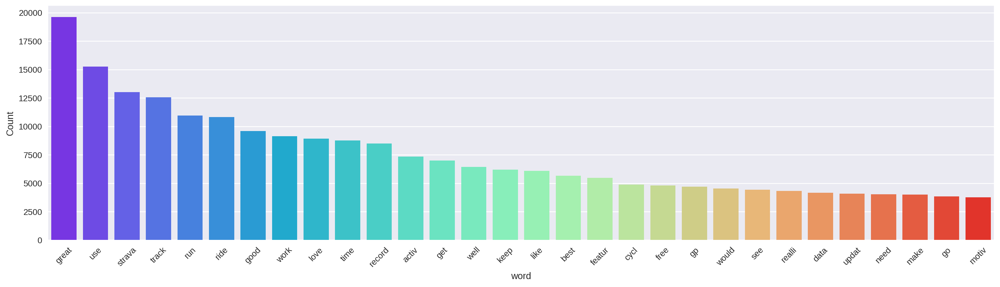

In [ ]:
# Frekuensi kata setelah pembersihan stopwords
freq_words(df_strava['cleaned_content'])

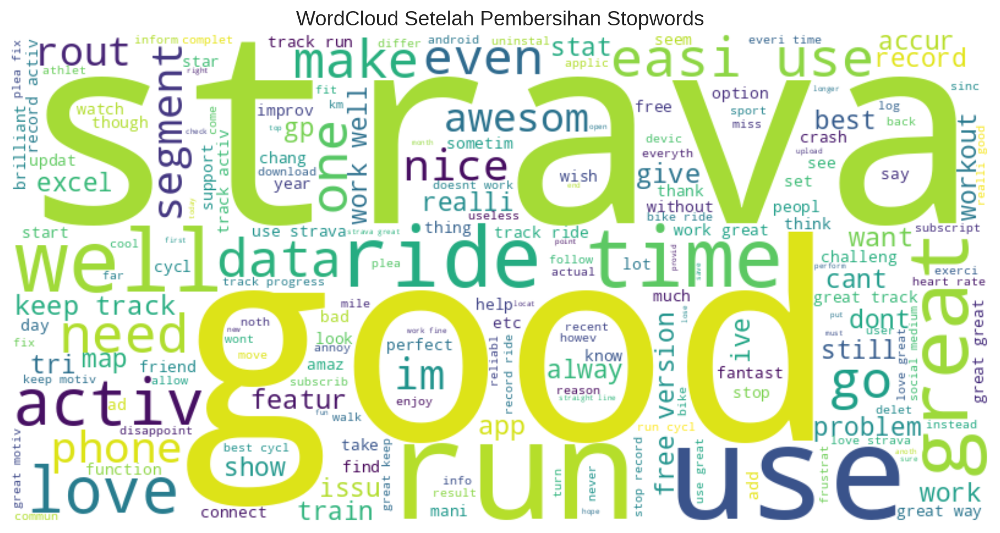

In [ ]:
# Gabungkan semua kata setelah pembersihan stopwords
all_words_after = ' '.join(df_strava['cleaned_content'])

# Buat WordCloud
wordcloud_after = WordCloud(width=800, height=400, background_color='white').generate(all_words_after)

# Plot WordCloud
plt.figure(figsize=(12, 6))
plt.imshow(wordcloud_after, interpolation='bilinear')
plt.axis('off')
plt.title("WordCloud Setelah Pembersihan Stopwords", fontsize=14)
plt.show()

In [ ]:
from collections import Counter
import pandas as pd

def freq_words_top5(text_column, n=5):
    """
    Menghitung n kata paling sering muncul dalam kolom teks.

    Parameters:
        text_column (pd.Series): Kolom teks dalam DataFrame.
        n (int): Jumlah kata teratas yang ingin ditampilkan (default = 5).

    Returns:
        pd.DataFrame: DataFrame dengan kata dan jumlah kemunculannya.
    """
    # Pastikan kolom tidak kosong atau berisi NaN
    text_column = text_column.dropna()

    # Gabungkan semua teks menjadi satu string
    all_words = ' '.join(text_column).split()

    # Hitung jumlah kemunculan setiap kata
    word_counts = Counter(all_words)

    # Konversi ke DataFrame
    words_df = pd.DataFrame({'word': list(word_counts.keys()), 'count': list(word_counts.values())})

    # Ambil n kata dengan frekuensi tertinggi
    top_words = words_df.nlargest(columns="count", n=n)

    return top_words

# Terapkan fungsi pada DataFrame df_strava
top_5_words = freq_words_top5(df_strava['cleaned_content'], n=5)
print(top_5_words)

       word  count
166   great  19620
46      use  15258
195  strava  13022
207   track  12561
96      run  10955


In [ ]:
df_strava.to_csv('df_strava.csv', index=False)

## Rating Score

In [ ]:
df_strava['score'].value_counts()

,count
score,
5,49414
1,13838
4,11644
3,5885
2,5660


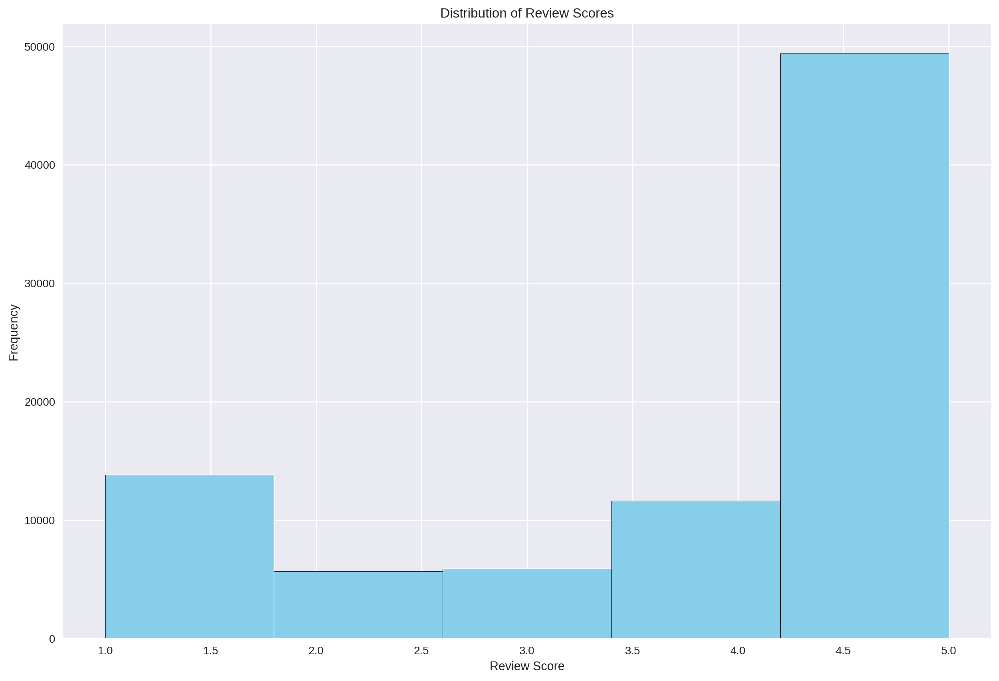

In [ ]:
import matplotlib.pyplot as plt

plt.hist(df_strava['score'], bins=5, color='skyblue', edgecolor='black')
plt.xlabel('Review Score')
plt.ylabel('Frequency')
plt.title('Distribution of Review Scores')
plt.show()


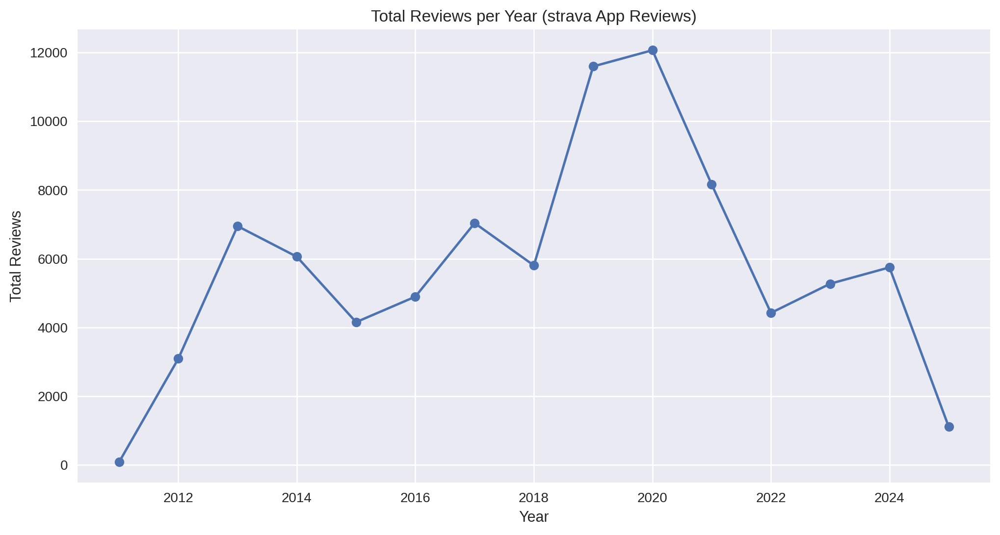

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Konversi kolom 'at' ke format datetime jika belum dalam bentuk datetime
df_strava['at'] = pd.to_datetime(df_strava['at'], errors='coerce')

# Ekstrak tahun dan bulan dari kolom 'at'
df_strava['year'] = df_strava['at'].dt.year
df_strava['month'] = df_strava['at'].dt.month

# Hitung jumlah ulasan per tahun
yearly_reviews = df_strava.groupby('year')['id'].count()

# Hitung jumlah ulasan per tahun dan bulan
monthly_reviews = df_strava.groupby(['year', 'month'])['id'].count()

# Plot jumlah ulasan per tahun
plt.figure(figsize=(12, 6))
plt.plot(yearly_reviews.index, yearly_reviews.values, marker='o', linestyle='-')
plt.xlabel('Year')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Year (strava App Reviews)')
plt.grid(True)
plt.show()

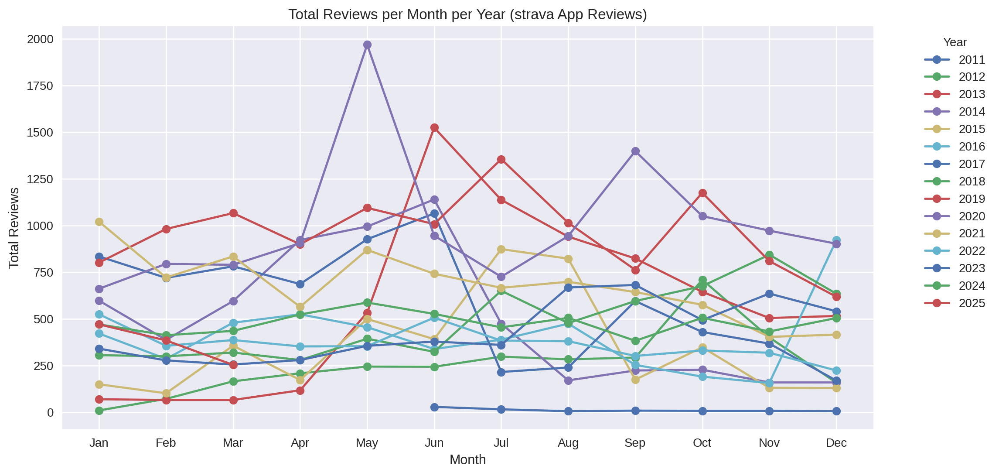

In [ ]:
# Membuat line chart untuk total ulasan per bulan per tahun
plt.figure(figsize=(12, 6))

# Loop untuk setiap tahun yang ada dalam dataset
for year in monthly_reviews.index.get_level_values(0).unique():
    year_data = monthly_reviews.loc[year]  # Ambil data berdasarkan tahun
    plt.plot(year_data.index, year_data.values, marker='o', label=str(year))

plt.xlabel('Month')
plt.ylabel('Total Reviews')
plt.title('Total Reviews per Month per Year (strava App Reviews)')
plt.legend(title="Year", bbox_to_anchor=(1.05, 1), loc='upper left')  # Tambahkan legenda di sebelah kanan
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])  # Label bulan
plt.grid(True)
plt.show()

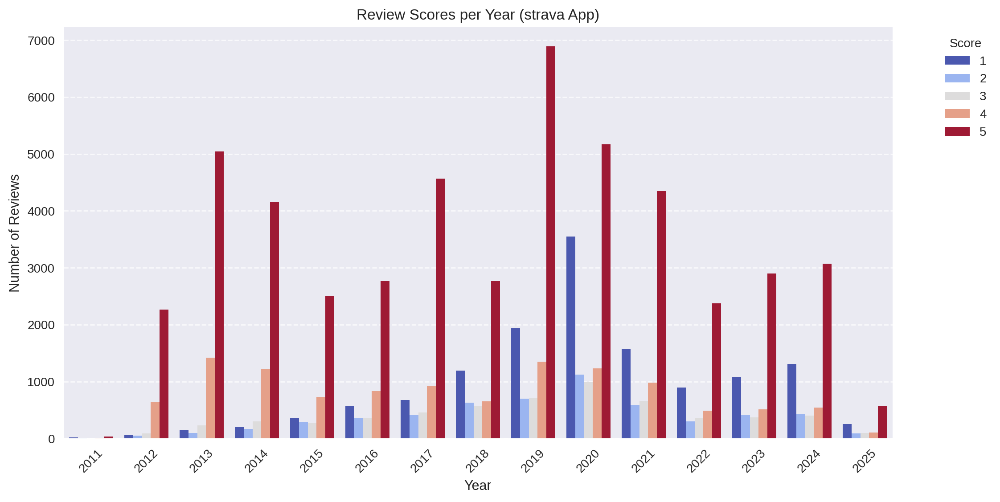

score,1,2,3,4,5
year,,,,,
2011,19,7,6,13,37
2012,54,50,85,636,2266
2013,155,100,229,1419,5045
2014,208,170,303,1226,4151
2015,352,292,280,731,2500
2016,577,358,360,835,2766
2017,676,412,460,922,4566
2018,1191,632,563,654,2764
2019,1939,701,714,1349,6890


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan kolom 'at' dalam format datetime
df_strava['at'] = pd.to_datetime(df_strava['at'])

# Ekstrak tahun dari kolom 'at'
df_strava['year'] = df_strava['at'].dt.year

# Kelompokkan data berdasarkan tahun dan score, lalu hitung jumlahnya
score_per_year = df_strava.groupby(['year', 'score'])['id'].count().reset_index()

# Buat bar chart
plt.figure(figsize=(12, 6))
sns.barplot(x='year', y='id', hue='score', data=score_per_year, palette="coolwarm")

# Kustomisasi tampilan grafik
plt.xlabel('Year')
plt.ylabel('Number of Reviews')
plt.title('Review Scores per Year (strava App)')
plt.legend(title='Score', bbox_to_anchor=(1.05, 1), loc='upper left')  # Letakkan legenda di samping kanan
plt.xticks(rotation=45)  # Rotasi label tahun agar lebih mudah dibaca
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Tambahkan grid horizontal
plt.show()

# DataFrame untuk melihat distribusi score per tahun dalam tabel
score_per_year_df = df_strava.groupby('year')['score'].value_counts().unstack(fill_value=0)
score_per_year_df

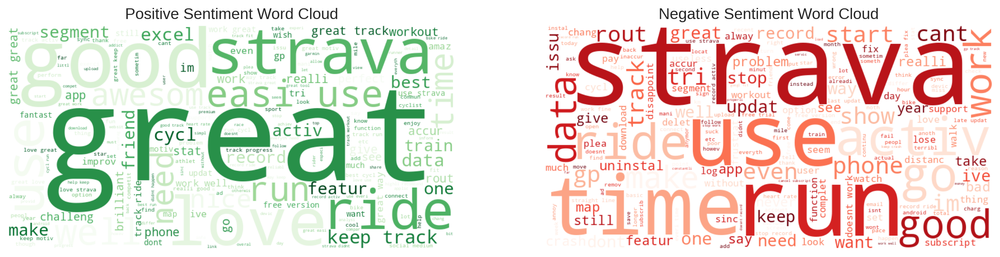

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Memisahkan ulasan positif dan negatif berdasarkan sentiment_rating
positive_reviews = df_strava[df_strava['sentiment_rating'] == 'Positive']['cleaned_content']
negative_reviews = df_strava[df_strava['sentiment_rating'] == 'Negative']['cleaned_content']

# Menggabungkan teks untuk setiap kategori
positive_text = ' '.join(positive_reviews.dropna())  # Drop NaN untuk menghindari error
negative_text = ' '.join(negative_reviews.dropna())

# Membuat wordcloud untuk masing-masing sentimen
positive_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Greens').generate(positive_text)
negative_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Reds').generate(negative_text)

# Menampilkan wordcloud
plt.figure(figsize=(16, 8))

# Wordcloud Sentimen Positif
plt.subplot(1, 2, 1)
plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Positive Sentiment Word Cloud", fontsize=14)

# Wordcloud Sentimen Negatif
plt.subplot(1, 2, 2)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.title("Negative Sentiment Word Cloud", fontsize=14)

plt.show()

In [ ]:
export_csv = df_strava.to_csv (r'df_strava.csv', index = None, header=True)